# Imports

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import json
import lime.lime_tabular
import shap
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from interpret.glassbox import ExplainableBoostingClassifier
from interpret import show
from sklearn.model_selection import train_test_split
from SyntheticDataset import SyntheticDataset
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from PerformanceAnalysis import PerformanceAnalysis
from Visualization import Visualization

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


# Setup

In [2]:
config_file = open('config.json') 
config_vars = json.load(config_file)
config_file.close()

logs_dir = config_vars["logs_dir"]

In [3]:
config_file = open('visual_config.json') 
config_vars = json.load(config_file)
config_file.close()

shap_colors_neg = config_vars["shap_colors"]["negative"]
shap_colors_pos = config_vars["shap_colors"]["positive"]
shap_colors = np.array([tuple(shap_colors_neg), tuple(shap_colors_pos)])

title_size = config_vars["title_font_size"]
label_size = config_vars["labels_font_size"]

# Binary Classification

## Create the Dataset

In [4]:
perf_analysis = PerformanceAnalysis()

min_val = -100
max_val = 100
num_rows = 1500
num_features = 10
num_classes = 2
rand_coef = [[0.75, 0.75],
             [0.6, 0.6],
             [0.5, 0.5],
             [0.4, 0.4],
             [0.35, 35],
             [0.3,0.3],
             [0.2, 0.2],
             [0.15, 0.15],
             [0.1, 0.1],
             [0.05, 0.05]]
features_names = ["Var" + (str(x)) for x in range(num_features)]
dataset = SyntheticDataset(min_val, max_val, num_rows, num_features, num_classes, rand_coef, seed=42)
dataset.generate()
dataset.get_data()

array([[  2,   0,   0, ...,   0,  21,   0],
       [-13,   4,  -6, ..., -18,  20,   1],
       [-63,  29,  91, ...,   0,   0,   0],
       ...,
       [ -2, -88,  53, ...,   0,  20,   1],
       [  0,  72,  49, ...,   0,   0,   0],
       [ 10,   4, -28, ..., -18,  20,   1]])

## Split the Dataset

In [5]:
X_train, X_test, Y_train, Y_test = train_test_split(
    dataset.get_x(),dataset.get_y(), test_size=0.20, random_state=42
)

X_train_pd = pd.DataFrame(X_train, columns=features_names)
X_test_pd = pd.DataFrame(X_test, columns=features_names)

## Instance to extract local explanations for all models

In [6]:
Exp_index = 3
Exp_inst = X_test[Exp_index, :]
Exp_inst_pd = X_test_pd.iloc[Exp_index, :]
Exp_inst_class = Y_test[Exp_index]
print(f"Instance:\n{Exp_inst_pd}\n\nClass: {Exp_inst_class}") #"Name" and "dtype" are not part of the instance, they must be ignored

Instance:
Var0   -34
Var1     4
Var2    84
Var3     8
Var4    80
Var5    12
Var6   -14
Var7    16
Var8   -18
Var9    20
Name: 3, dtype: int32

Class: 1


# Classification

## <i>Logistic Regression</i> (LR)

In [7]:
lr_clf = LogisticRegression(max_iter=2000).fit(X_train, Y_train)

Metrics,Values
accuracy,0.930000
false-positive rate,0.075949
false-negative rate,0.063380
precision,0.917241
recall,0.936620
f-score,0.926829


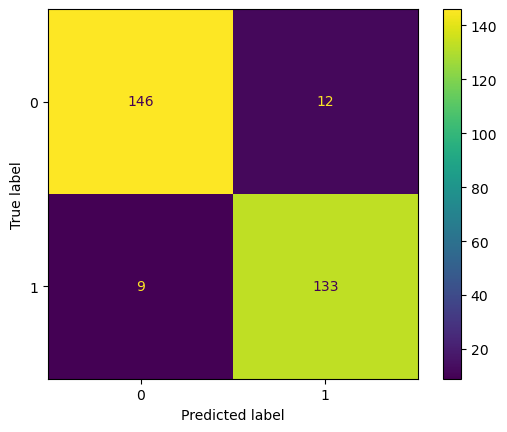

In [8]:
lr_ye = lr_clf.predict(X_test)

lr_cm = confusion_matrix(Y_test, lr_ye)
lr_metrics = perf_analysis.compute_metrics(lr_cm)
display(lr_metrics)

ConfusionMatrixDisplay.from_predictions(Y_test, lr_ye)

lr_y2d = lr_clf.predict_proba(X_test)[:, 1]

plt.show()

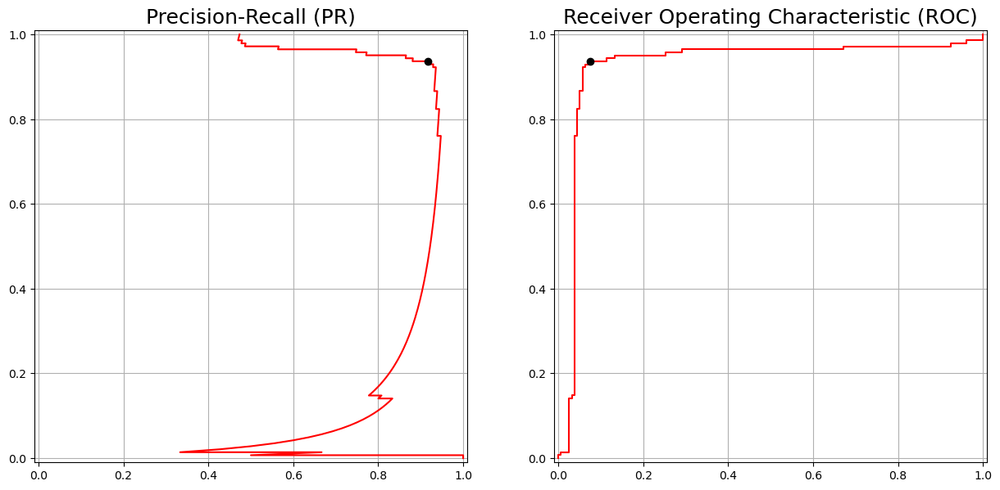

In [9]:
plt.figure(figsize=(15, 10))

plt.subplot(1,2,1)
perf_analysis.plot_PR(Y_test, lr_cm, lr_y2d)
plt.subplot(1,2,2)
perf_analysis.plot_ROC(Y_test, lr_cm, lr_y2d)

plt.show()

### Extract Explanations

#### Local

##### <i>Local Model-Agnostic Explanations</i> (LIME)

In [10]:
lr_LIME_explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=features_names)
lr_LIME_explanation = lr_LIME_explainer.explain_instance(Exp_inst, lr_clf.predict_proba)

In [11]:
lr_LIME_explanation.show_in_notebook(show_table=True)

##### <i>SHapley Additive exPlanations</i> (SHAP)

In [12]:
shap.initjs()

In [13]:
lr_SHAP_exp = shap.KernelExplainer(lr_clf.predict_proba, shap.sample(X_train_pd, 100))
lr_shap_loc_values = np.array(lr_SHAP_exp.shap_values(Exp_inst_pd))

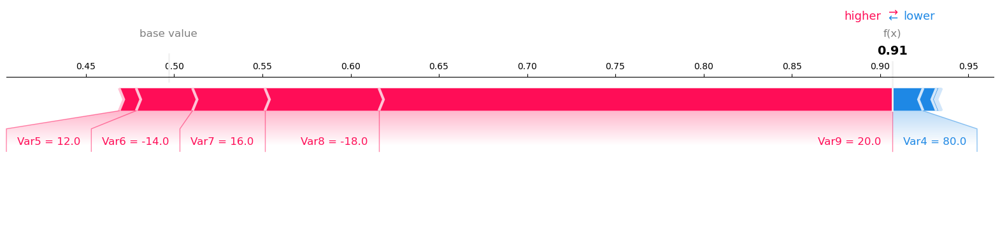

In [14]:
shap.force_plot(lr_SHAP_exp.expected_value[1], lr_shap_loc_values[1, :], Exp_inst_pd, matplotlib=True)

#### Global (SHAP)

In [15]:
lr_shap_global_values = lr_SHAP_exp.shap_values(X_test_pd)

  0%|          | 0/300 [00:00<?, ?it/s]

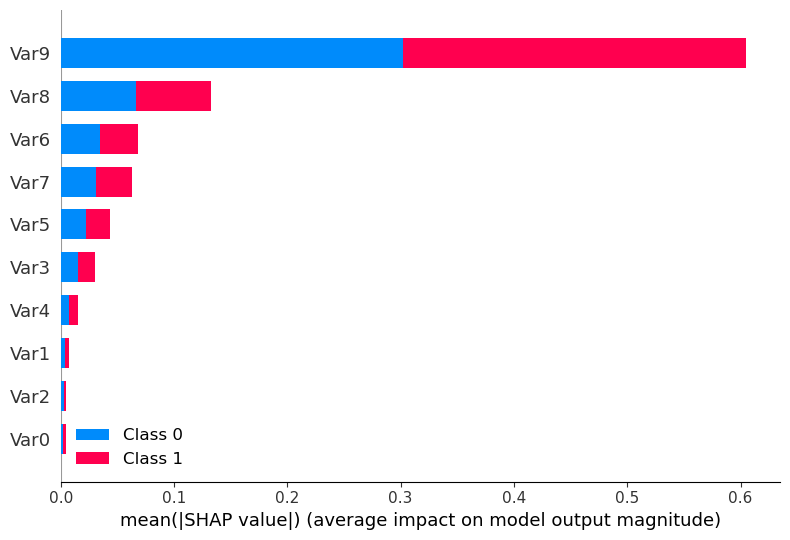

In [16]:
shap.summary_plot(lr_shap_global_values, X_test_pd, plot_type="bar")

## <i>Random Forest</i> (RF)

In [17]:
rf_clf = RandomForestClassifier().fit(X_train, Y_train)

Metrics,Values
accuracy,0.996667
false-positive rate,0.000000
false-negative rate,0.007042
precision,1.000000
recall,0.992958
f-score,0.996466


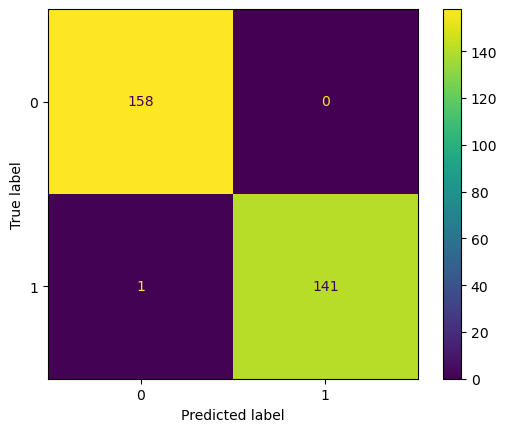

In [18]:
rf_ye = rf_clf.predict(X_test)

rf_cm = confusion_matrix(Y_test, rf_ye)
rf_metrics = perf_analysis.compute_metrics(rf_cm)
display(rf_metrics)

ConfusionMatrixDisplay.from_predictions(Y_test, rf_ye)

rf_y2d = rf_clf.predict_proba(X_test)[:, 1]

plt.show()

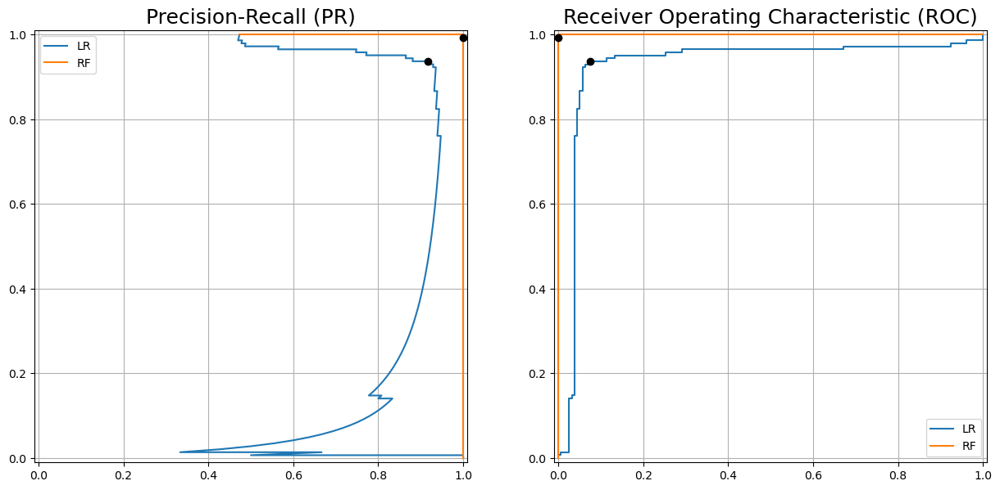

In [19]:
plt.figure(figsize=(15,10))

plt.subplot(1,2,1)
perf_analysis.compare_PR([Y_test, Y_test], [lr_cm, rf_cm], [lr_y2d, rf_y2d], ["LR", "RF"])

plt.subplot(1,2,2)
perf_analysis.compare_ROC([Y_test, Y_test], [lr_cm, rf_cm], [lr_y2d, rf_y2d], ["LR","RF"])


plt.show()

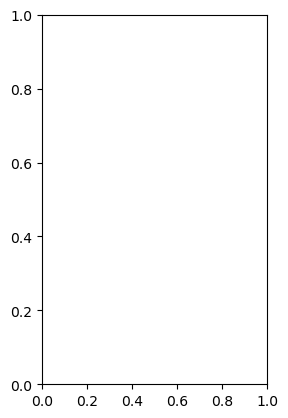

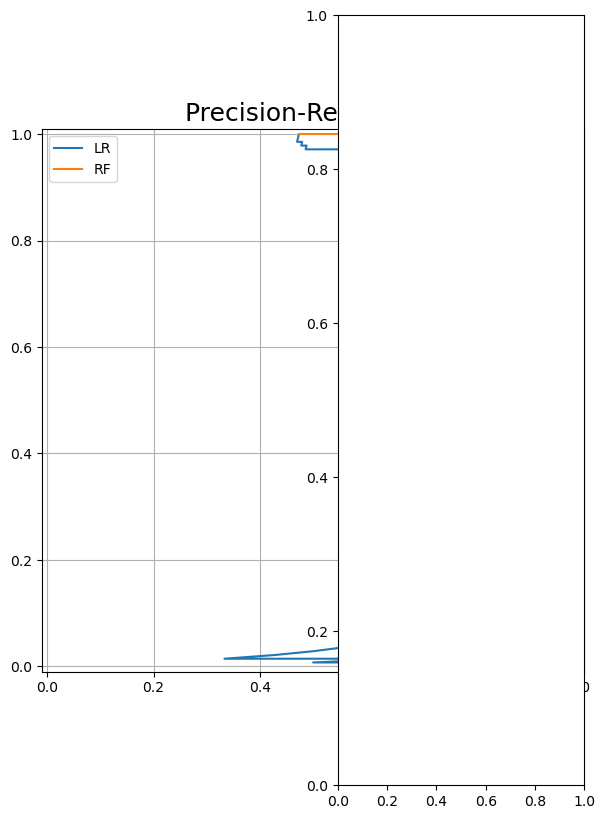

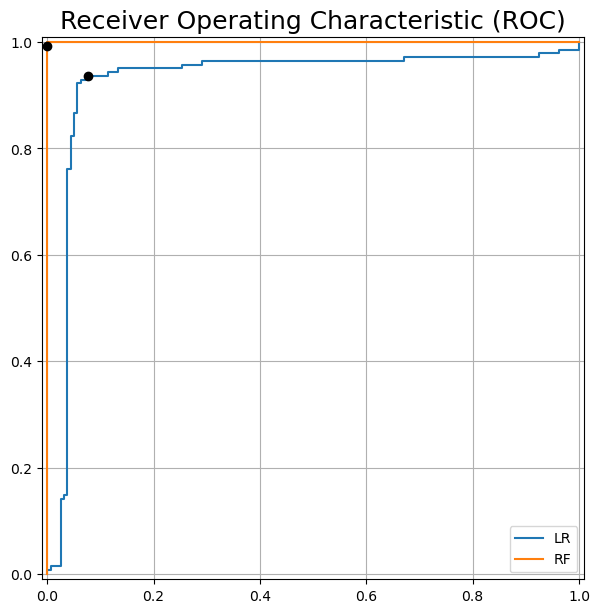

In [20]:
plt.subplot(1,2,1)

plt.figure(figsize=(7,10))
perf_analysis.compare_PR([Y_test, Y_test], [lr_cm, rf_cm], [lr_y2d, rf_y2d], ["LR", "RF"])

plt.subplot(1,2,2)
plt.figure(figsize=(7,10))
perf_analysis.compare_ROC([Y_test, Y_test], [lr_cm, rf_cm], [lr_y2d, rf_y2d], ["LR","RF"])

In [21]:
from sklearn.metrics import roc_curve
def compare_ROC(ytests, cms, y2ds, labels=None, title_font_size = None, axis_font_size = None):

    title_fs = 18
    if title_font_size is not None:
        title_fs = title_font_size

    axis_fs = 13
    if axis_font_size is not None:
        axis_fs = axis_font_size

    plt.title("Receiver Operating Characteristic (ROC)", fontsize=title_fs)
    plt.axis('scaled')
    plt.axis((-.01, 1.01, -.01, 1.01))
    plt.tick_params(axis='both', labelsize=axis_fs)
    plt.grid(True)

    for idx in range(len(cms)):
        fp1, tp1, l1 = roc_curve(ytests[idx], y2ds[idx])

        if labels is not None:
            plt.plot(fp1, tp1, label=labels[idx])
        else:
            plt.plot(fp1, tp1)

        cm = cms[idx]

        fp10 = cm[0, 1] / (cm[0, 1] + cm[0, 0])
        tp10 = cm[1, 1] / (cm[1, 1] + cm[1, 0])

        plt.plot(fp10, tp10, 'ok')

    if labels is not None:
        plt.legend()

### Extract Explanations 

#### Local

##### <i>Local Model-Agnostic Explanations</i> (LIME)

In [22]:
rf_LIME_explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=features_names)
rf_LIME_explanation = rf_LIME_explainer.explain_instance(Exp_inst, rf_clf.predict_proba)

In [23]:
rf_LIME_explanation.show_in_notebook(show_table=True)

##### <i>SHapley Additive exPlanations</i> (SHAP)

In [24]:
rf_SHAP_exp = shap.Explainer(rf_clf)
rf_shap_loc_values = np.array(rf_SHAP_exp.shap_values(Exp_inst_pd))

In [25]:
shap.force_plot(rf_SHAP_exp.expected_value[1], rf_shap_loc_values[1, :], Exp_inst_pd)

#### Global (SHAP)

In [26]:
rf_shap_global_values = rf_SHAP_exp.shap_values(X_test_pd)

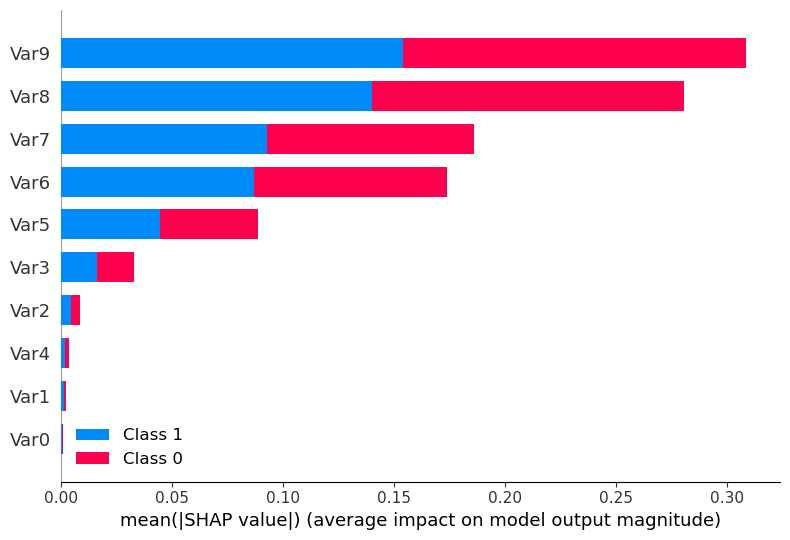

In [27]:
shap.summary_plot(rf_shap_global_values, X_test_pd, plot_type="bar")

## <i> Support Vector Machines</i> (SVM)

In [28]:
svm_clf = SVC(probability=True).fit(X_train, Y_train)

Metrics,Values
accuracy,0.923333
false-positive rate,0.094937
false-negative rate,0.056338
precision,0.899329
recall,0.943662
f-score,0.920962


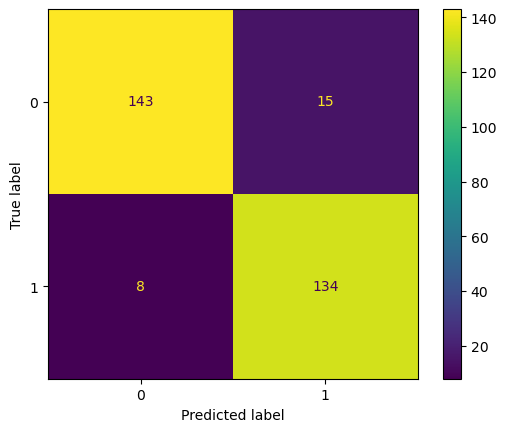

In [29]:
svm_ye = svm_clf.predict(X_test)

svm_cm = confusion_matrix(Y_test, svm_ye)
svm_metrics = perf_analysis.compute_metrics(svm_cm)
display(svm_metrics)

ConfusionMatrixDisplay.from_predictions(Y_test, svm_ye)

svm_y2d = svm_clf.decision_function(X_test)

plt.show()

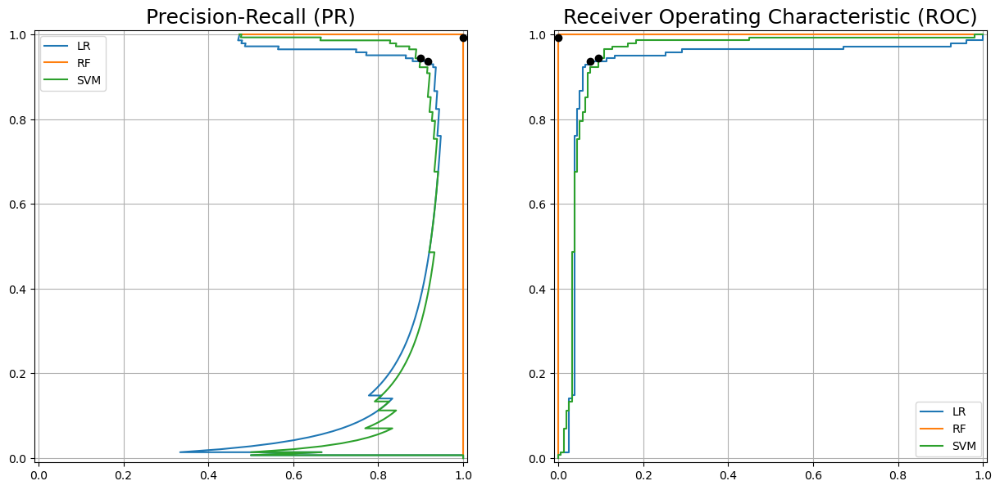

In [30]:
plt.figure(figsize=(15,10))

plt.subplot(1,2,1)
perf_analysis.compare_PR([Y_test, Y_test, Y_test], [lr_cm, rf_cm, svm_cm], [lr_y2d, rf_y2d, svm_y2d], ["LR", "RF", "SVM"])
plt.subplot(1,2,2)
perf_analysis.compare_ROC([Y_test, Y_test, Y_test], [lr_cm, rf_cm, svm_cm], [lr_y2d, rf_y2d, svm_y2d], ["LR","RF", "SVM"])

plt.show()

### Extract Explanations

#### Local

##### <i>Local Model-Agnostic Explanations</i> (LIME)

In [31]:
svm_LIME_explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=features_names)
svm_LIME_explanation = svm_LIME_explainer.explain_instance(Exp_inst, svm_clf.predict_proba)

In [32]:
svm_LIME_explanation.show_in_notebook(show_table=True)

##### <i>SHapley Additive exPlanations</i> (SHAP)

In [33]:
svm_SHAP_exp = shap.KernelExplainer(svm_clf.predict_proba, shap.sample(X_train_pd, 20))
svm_shap_loc_values = np.array(svm_SHAP_exp.shap_values(Exp_inst_pd))

In [34]:
shap.force_plot(svm_SHAP_exp.expected_value[1], svm_shap_loc_values[1, :], Exp_inst_pd)

#### Global (SHAP)

In [35]:
svm_shap_global_values = svm_SHAP_exp.shap_values(X_test_pd)

  0%|          | 0/300 [00:00<?, ?it/s]

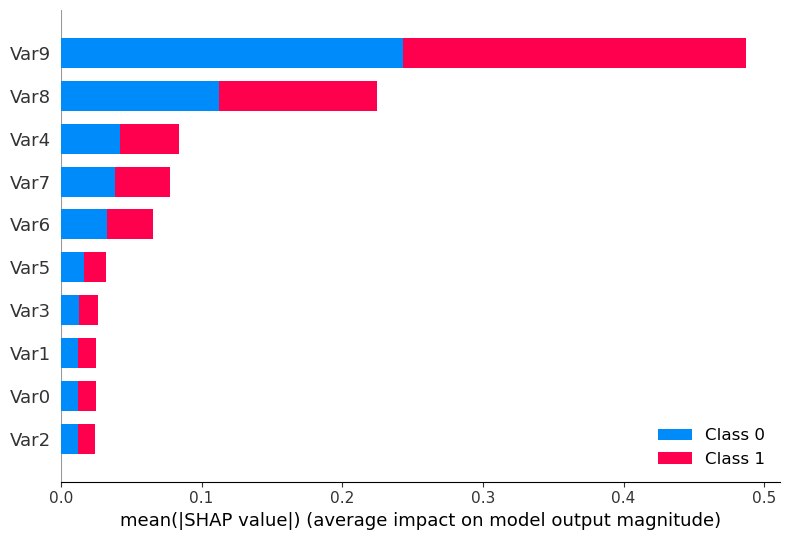

In [36]:
shap.summary_plot(svm_shap_global_values, X_test_pd, plot_type="bar")

## <i>Explainable Boosting Machine</i> (EBM)

In [37]:
ebm_clf = ExplainableBoostingClassifier()
ebm_clf.fit(X_train_pd, Y_train)

ExplainableBoostingClassifier()

Metrics,Values
accuracy,1.0
false-positive rate,0.0
false-negative rate,0.0
precision,1.0
recall,1.0
f-score,1.0


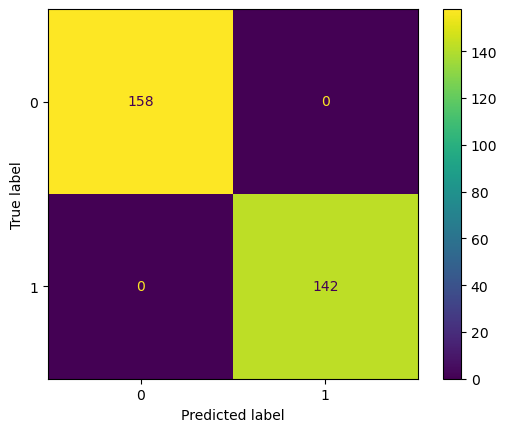

In [38]:
ebm_ye = ebm_clf.predict(X_test)

ebm_cm = confusion_matrix(Y_test, ebm_ye)
ebm_metrics = perf_analysis.compute_metrics(ebm_cm)
display(ebm_metrics)

ConfusionMatrixDisplay.from_predictions(Y_test, ebm_ye)

ebm_y2d = ebm_clf.decision_function(X_test)

plt.show()

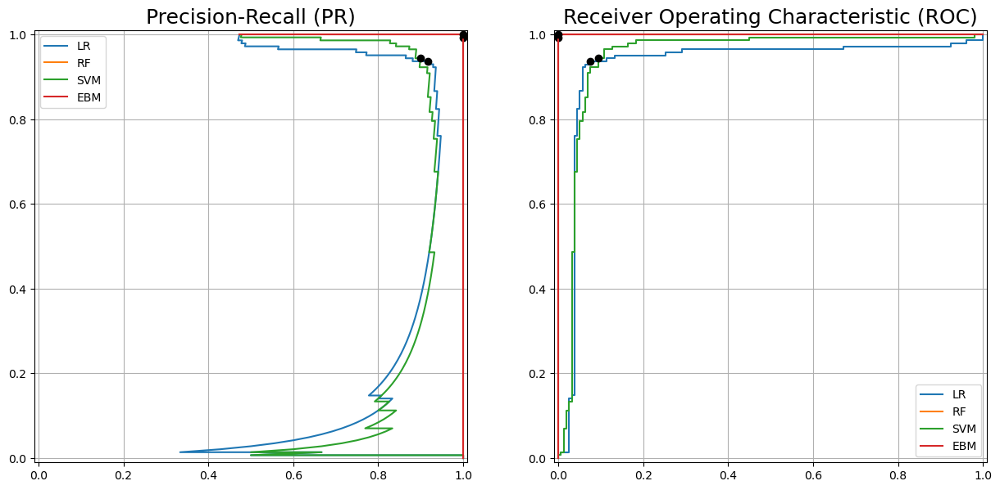

In [39]:
plt.figure(figsize=(15,10))

plt.subplot(1,2,1)
perf_analysis.compare_PR([Y_test, Y_test, Y_test, Y_test], [lr_cm, rf_cm, svm_cm, ebm_cm], [lr_y2d, rf_y2d, svm_y2d, ebm_y2d], ["LR", "RF", "SVM", "EBM"])
plt.subplot(1,2,2)
perf_analysis.compare_ROC([Y_test, Y_test, Y_test, Y_test], [lr_cm, rf_cm, svm_cm, ebm_cm], [lr_y2d, rf_y2d, svm_y2d, ebm_y2d], ["LR","RF", "SVM", "EBM"])

plt.show()

### Extract Explanations

#### Local

In [40]:
ebm_local = ebm_clf.explain_local(X_test, Y_test)
show(ebm_local)

<!-- http://127.0.0.1:7558/2971994893584/ -->

#### Global

In [41]:
ebm_global = ebm_clf.explain_global()
show(ebm_global)

<!-- http://127.0.0.1:7558/2971823936656/ -->

# Summary

In [42]:
visual = Visualization()

## Metrics

In [43]:
lr_metrics = lr_metrics.rename(columns={"Values": "LR"})
lr_metrics["LR"] = [round(x, 2) for x in lr_metrics["LR"]]
rf_metrics = rf_metrics.rename(columns={"Values": "RF"})
rf_metrics["RF"] = [round(x, 2) for x in rf_metrics["RF"]]
svm_metrics = svm_metrics.rename(columns={"Values": "SVM"})
svm_metrics["SVM"] = [round(x, 2) for x in svm_metrics["SVM"]]
ebm_metrics = ebm_metrics.rename(columns={"Values": "EBM"})
ebm_metrics["EBM"] = [round(x, 2) for x in ebm_metrics["EBM"]]

overall_metrics = pd.concat([lr_metrics, rf_metrics, svm_metrics, ebm_metrics], axis=1)
display(overall_metrics)

Metrics,LR,RF,SVM,EBM
accuracy,0.93,1.00,0.92,1.0
false-positive rate,0.08,0.00,0.09,0.0
false-negative rate,0.06,0.01,0.06,0.0
precision,0.92,1.00,0.90,1.0
recall,0.94,0.99,0.94,1.0
f-score,0.93,1.00,0.92,1.0


In [44]:
latex_str = overall_metrics.columns.name  + ''.join([" & " + x for x in overall_metrics.columns]) + " \\\ \n"

In [45]:
for i, row in overall_metrics.iterrows():
    
    aux_str = ""
    for k in row:
        aux_str += f" & {k}"
    
    latex_str += aux_str[3:] + " \\\ \n"

with open(f"{logs_dir}/synth_bin_metrics.txt", "w") as text_file:
    print(latex_str, file=text_file)

## Confusion Matrices

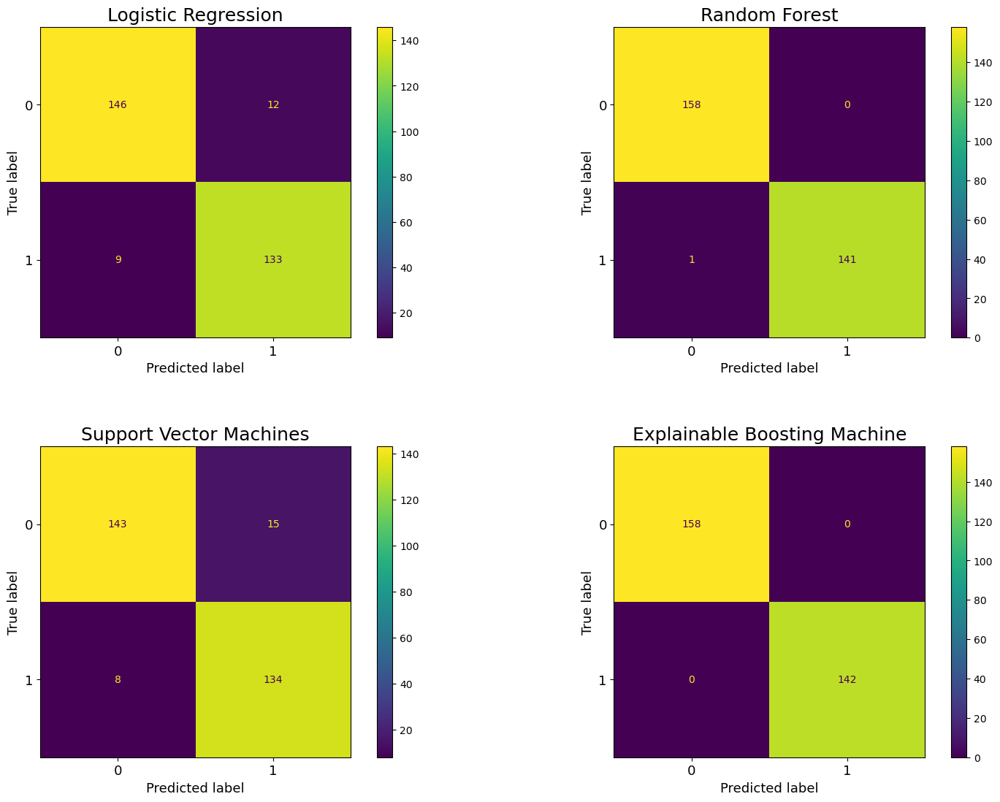

In [46]:
visual.confusion_matrices([Y_test, Y_test, Y_test, Y_test], 
                          [lr_ye, rf_ye, svm_ye, ebm_ye],
                          nrows=2, 
                          ncols=2, 
                          figsize=(15,10),
                          title_size=title_size,
                          label_size=label_size,
                          titles=["Logistic Regression", "Random Forest", "Support Vector Machines", "Explainable Boosting Machine"]
                          )

plt.show()

## Curves

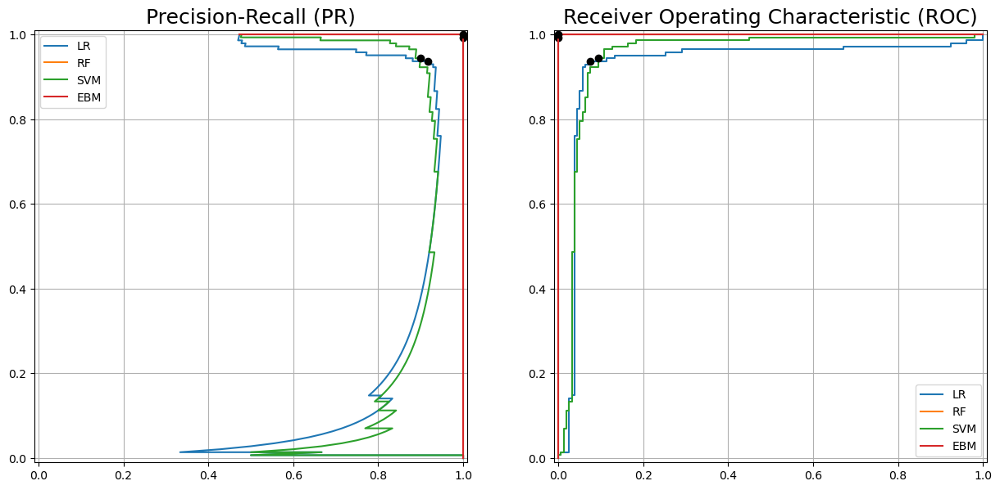

In [47]:
plt.figure(figsize=(15,10))

plt.subplot(1,2,1)
perf_analysis.compare_PR([Y_test, Y_test, Y_test, Y_test], [lr_cm, rf_cm, svm_cm, ebm_cm], [lr_y2d, rf_y2d, svm_y2d, ebm_y2d], ["LR", "RF", "SVM", "EBM"])
plt.subplot(1,2,2)
perf_analysis.compare_ROC([Y_test, Y_test, Y_test, Y_test], [lr_cm, rf_cm, svm_cm, ebm_cm], [lr_y2d, rf_y2d, svm_y2d, ebm_y2d], ["LR","RF", "SVM", "EBM"])

plt.savefig(f"{logs_dir}/synth_bin_PR_ROC.png")
plt.show()

## Local Explanations

### LIME

In [48]:
lr_LIME_explanation.show_in_notebook(show_table=True)

In [49]:
rf_LIME_explanation.show_in_notebook(show_table=True)

In [50]:
svm_LIME_explanation.show_in_notebook(show_table=True)

### SHAP & EBM

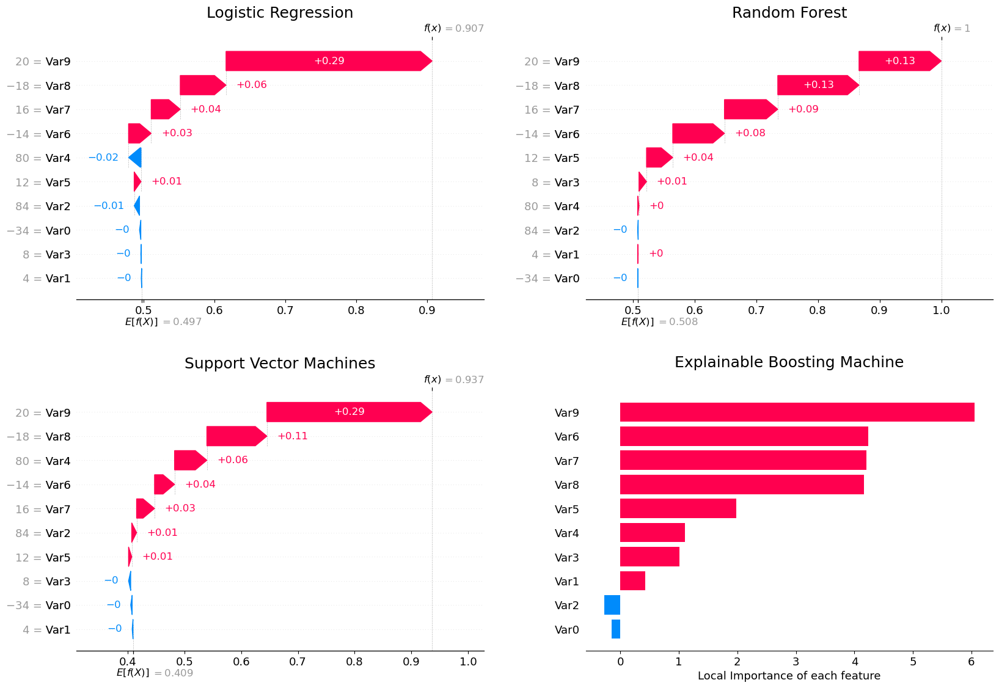

In [51]:
explanations = [shap.Explanation(lr_shap_loc_values[1, :], lr_SHAP_exp.expected_value[1], data=Exp_inst_pd),
                shap.Explanation(rf_shap_loc_values[1, :], rf_SHAP_exp.expected_value[1], data=Exp_inst_pd),
                shap.Explanation(svm_shap_loc_values[1, :], svm_SHAP_exp.expected_value[1], data=Exp_inst_pd)]


visual.local_shap(explanations, 
                  ebm_local.data(key=Exp_index),
                  nrows = 2,
                  ncols = 2,
                  figsize = (15,10),
                  title_size = title_size,
                  label_size = label_size,
                  titles = ["Logistic Regression", "Random Forest", "Support Vector Machines"],
                  ebm_colors = shap_colors/255)

plt.savefig(f"{logs_dir}/synth_bin_local_SHAP_EBM.png", bbox_inches="tight")

plt.show()


## Global Explanations

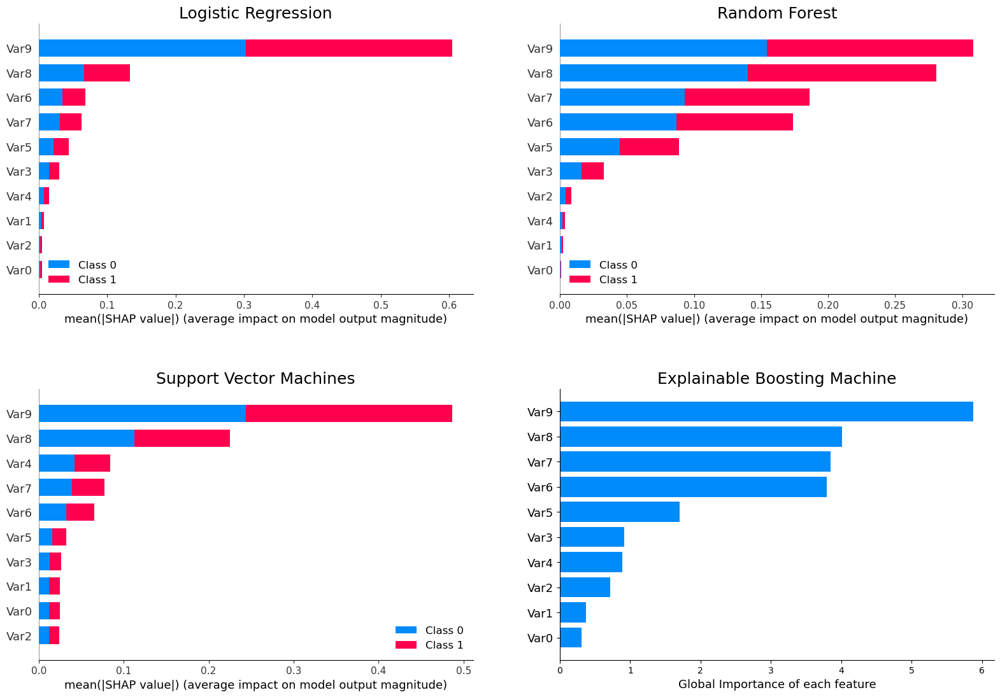

In [52]:
global_shap_values = [lr_shap_global_values,
                      rf_shap_global_values,
                      svm_shap_global_values]

visual.global_shap(global_shap_values,
                X_test_pd,
                  ebm_global.data(),
                  nrows = 2,
                  ncols = 2,
                  figsize = (15,10),
                  title_size = title_size,
                  label_size = label_size,
                  titles = ["Logistic Regression", "Random Forest", "Support Vector Machines"],
                  ebm_colors = shap_colors/255)

plt.savefig(f"{logs_dir}/synth_bin_global_SHAP_EBM.png", bbox_inches="tight")

plt.show()